# Conformal Prediction for FLAIR Segmentation

## Setup

In [ ]:
# from google.colab import drive
# drive.mount("/content/drive")
# %cd /content/drive/MyDrive/Deep\ Learning\ Project/DLE-Flair-Segmentation

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive/Deep Learning Project/DLE-Flair-Segmentation


In [ ]:
# !pip install -r requirements.txt -q

In [ ]:
from pathlib import Path
import os, sys

NOTEBOOK_DIR = Path.cwd()
REPO_ROOT = NOTEBOOK_DIR if (NOTEBOOK_DIR / "src").exists() else NOTEBOOK_DIR.parent
if str(REPO_ROOT) not in sys.path:
    sys.path.insert(0, str(REPO_ROOT))

print(f"Repo root: {REPO_ROOT}")

Repo root: /content/drive/MyDrive/Deep Learning Project/DLE-Flair-Segmentation


In [ ]:
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec
from matplotlib.colors import ListedColormap, BoundaryNorm
import yaml
from tqdm.auto import tqdm

from src.data import build_dataloaders, load_class_map
from src.models import build_model
from src.train import sync_class_config
from src.utils import get_device, load_config
from src.calibrate import collect_calibration_scores, compute_qhat, run_conformal_for_model
from src.evaluate import evaluate_conformal
from src.visualize import plot_score_and_coverage_summary, plot_set_size_distribution, plot_qualitative_grid, plot_multi_model_comparison

device = get_device()
print(f"Using device: {device}")

Using device: cuda


In [ ]:
PALETTE = [
    "#2c3e50",  # 0 Background   — dark navy
    "#e74c3c",  # 1 Building      — red
    "#27ae60",  # 2 Pervious      — green
    "#95a5a6",  # 3 Impervious    — grey
    "#d35400",  # 4 Bare soil     — orange
    "#3498db",  # 5 Water         — blue
]

## Load config

In [ ]:
# Load the conformal prediction config
with open(REPO_ROOT / "configs" / "conformal_prediction.yaml") as f:
    cp_config = yaml.safe_load(f)

ALPHA        = cp_config["conformal"]["alpha"]
CLASS_NAMES  = cp_config["class_names"]
NUM_CLASSES  = len(CLASS_NAMES)
VIZ_SAMPLES  = cp_config["visualization"]["num_samples"]
RGB_CHANNELS = cp_config["visualization"]["rgb_channels"]
VIZ_OUT_DIR  = REPO_ROOT / cp_config["visualization"]["output_dir"]
VIZ_OUT_DIR.mkdir(parents=True, exist_ok=True)

print(f"Alpha: {ALPHA}")
print(f"Target coverage: {1-ALPHA:.0%}")
print(f"Classes ({NUM_CLASSES}): {CLASS_NAMES}")

Alpha: 0.1
Target coverage: 90%
Classes (6): ['Background', 'Building', 'Pervious surface', 'Impervious surface', 'Bare soil', 'Water']


## ResNet34-UNet 3 Channels

### Load model + data

In [ ]:
MODEL_KEY = "resnet34_unet_3ch"

model_entry = next(m for m in cp_config["models"] if m["name"] == MODEL_KEY)

train_config = sync_class_config(load_config(REPO_ROOT / model_entry["config"]))

# pick only the channels we want (first N channels)
all_channels = list(range(1, 6))
train_config["data"]["channels"] = all_channels[:model_entry["in_channels"]]

print(f"Model : {model_entry['label']}")
print(f"Checkpoint: {model_entry['checkpoint']}")

Model : ResNet34-UNet (3ch)
Checkpoint: outputs/resnet34_unet_3ch_val_IoU/best.pt


In [ ]:
train_loader, val_loader, test_loader = build_dataloaders(train_config["data"])
print(f"Loaders: train={len(train_loader)} val={len(val_loader)} test={len(test_loader)} batches")

# sanity check
batch = next(iter(val_loader))
images, masks = batch["image"], batch["mask"]
print(f"images {images.shape}  masks {masks.shape}  classes {torch.unique(masks).tolist()}")

Loaders: train=25 val=4 test=4 batches
images torch.Size([8, 3, 512, 512])  masks torch.Size([8, 512, 512])  classes [0, 2, 3, 4, 5]


In [ ]:
model = build_model(train_config["model"])

ckpt_path = REPO_ROOT / model_entry["checkpoint"]
checkpoint = torch.load(ckpt_path, map_location=device)
model.load_state_dict(checkpoint["model_state_dict"])
model.to(device).eval()
print("Model loaded")

Model loaded


### Calibration: collect nonconformity scores

In [ ]:
scores = collect_calibration_scores(model, val_loader, NUM_CLASSES, device)
print()
print(f"Calibration pixels: {len(scores):,}")
print(f"Score distribution: min={scores.min():.4f}  mean={scores.mean():.4f}  max={scores.max():.4f}")

Calibrating: 100%|██████████| 4/4 [00:03<00:00,  1.28it/s]


Calibration pixels: 6,553,600
Score distribution: min=0.0478  mean=0.4612  max=0.9969


### Compute q̂

In [ ]:
q_hat = compute_qhat(scores, ALPHA)
threshold = 1.0 - q_hat

print(f"α = {ALPHA}: target coverage = {1-ALPHA:.0%}")
print(f"q̂ = {q_hat:.4f}: inclusion threshold p_c must be greater than equal to {threshold:.4f}")
print()
print("Interpretation:")
print(f"  A class is included in the prediction set when its softmax score is greater than equal to {threshold:.4f}.")
if q_hat > 0.85:
    print("q̂ is high — the model is uncertain. Set sizes will be large.")
elif q_hat < 0.3:
    print("q̂ is low — the model is confident. Sets will be close to size 1.")

α = 0.1: target coverage = 90%
q̂ = 0.7883: inclusion threshold p_c must be greater than equal to 0.2117

Interpretation:
  A class is included in the prediction set when its softmax score is greater than equal to 0.2117.


### test set

In [ ]:
(coverage, avg_set_size, per_class_cov,set_size_maps, pred_set_maps, all_probs, all_images, all_masks) = evaluate_conformal(model, test_loader, q_hat, NUM_CLASSES, device)
print(f"Coverage: {coverage:.2%}")
print(f"Avg set size: {avg_set_size:.2f}")
print(f"Per-class coverage: {per_class_cov}")

Evaluating: 100%|██████████| 4/4 [00:02<00:00,  1.99it/s]

Coverage: 84.01%
Avg set size: 1.45
Per-class coverage: [0.97099022 0.10000221 0.97272087 0.83066741 0.71493586 0.45898474]


### Summary metrics

In [ ]:
print("=" * 52)
print(f"  Model       : {model_entry['label']}")
print(f"  α           : {ALPHA}")
print(f"  q̂           : {q_hat:.4f}")
print(f"  Threshold   : {1-q_hat:.4f}")
print("+" * 52)
print(f"  Target  coverage : {1-ALPHA:.2%}")
print(f"  Empirical coverage: {coverage:.2%}  {'Meets Target' if coverage >= 1-ALPHA else 'Below Target'}")
print(f"  Avg set size : {avg_set_size:.3f} / {NUM_CLASSES} classes")
print("+" * 52)
print("  Per-class coverage:")
for i, (name, cov) in enumerate(zip(CLASS_NAMES, per_class_cov)):
    marker = "Satisfied     - " if cov >= 1-ALPHA else "Not Satisfied - "
    bar = "█" * int(cov * 20)
    print(f"    {marker} {name:25s}  {cov:.2%}  |{bar}")
print("=" * 52)

  Model       : ResNet34-UNet (3ch)
  α           : 0.1
  q̂           : 0.7883
  Threshold   : 0.2117
++++++++++++++++++++++++++++++++++++++++++++++++++++
  Target  coverage : 90.00%
  Empirical coverage: 84.01%  Below Target
  Avg set size : 1.452 / 6 classes
++++++++++++++++++++++++++++++++++++++++++++++++++++
  Per-class coverage:
    Satisfied     -  Background                 97.10%  |███████████████████
    Not Satisfied -  Building                   10.00%  |██
    Satisfied     -  Pervious surface           97.27%  |███████████████████
    Not Satisfied -  Impervious surface         83.07%  |████████████████
    Not Satisfied -  Bare soil                  71.49%  |██████████████
    Not Satisfied -  Water                      45.90%  |█████████


### Visualisation 1 — Score distribution & q̂

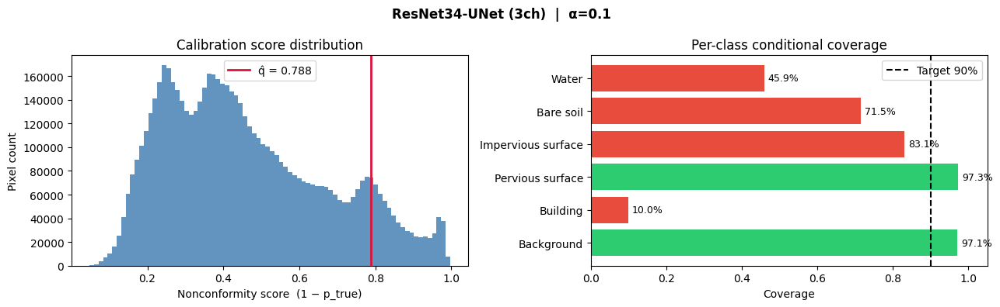

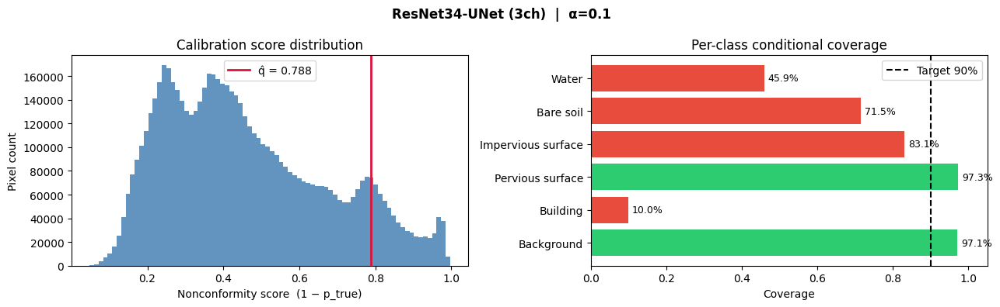

In [ ]:
plot_score_and_coverage_summary(scores, q_hat, ALPHA, per_class_cov, CLASS_NAMES, model_entry['label'], VIZ_OUT_DIR, MODEL_KEY, cp_config['visualization']['dpi'])

### Visualisation 2 — Set size distribution

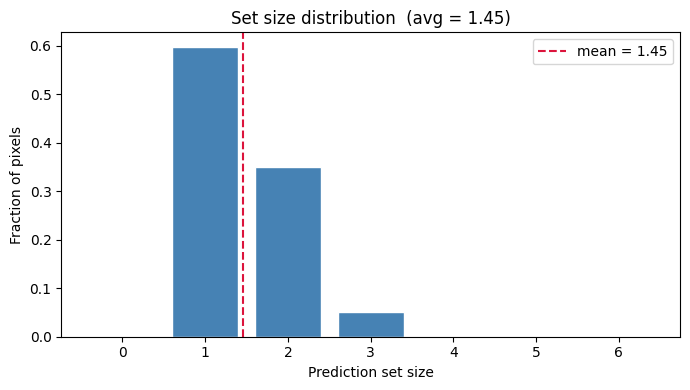

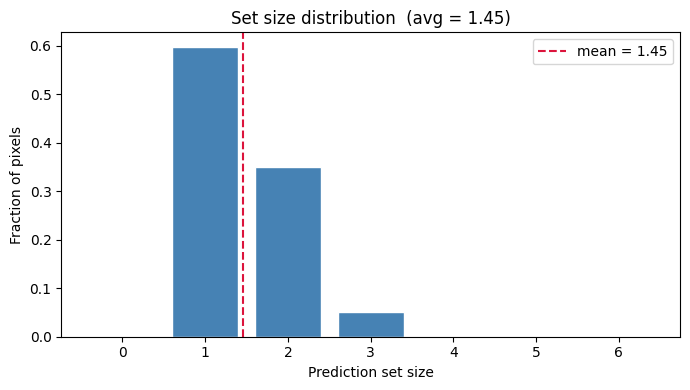

In [ ]:
all_set_sizes = np.concatenate([s.numpy().ravel() for s in set_size_maps])
plot_set_size_distribution(all_set_sizes, NUM_CLASSES, avg_set_size, VIZ_OUT_DIR, MODEL_KEY, cp_config['visualization']['dpi'])

### Visualisation 3 — Qualitative grid: Image | GT | Argmax pred | Set size | Uncertainty

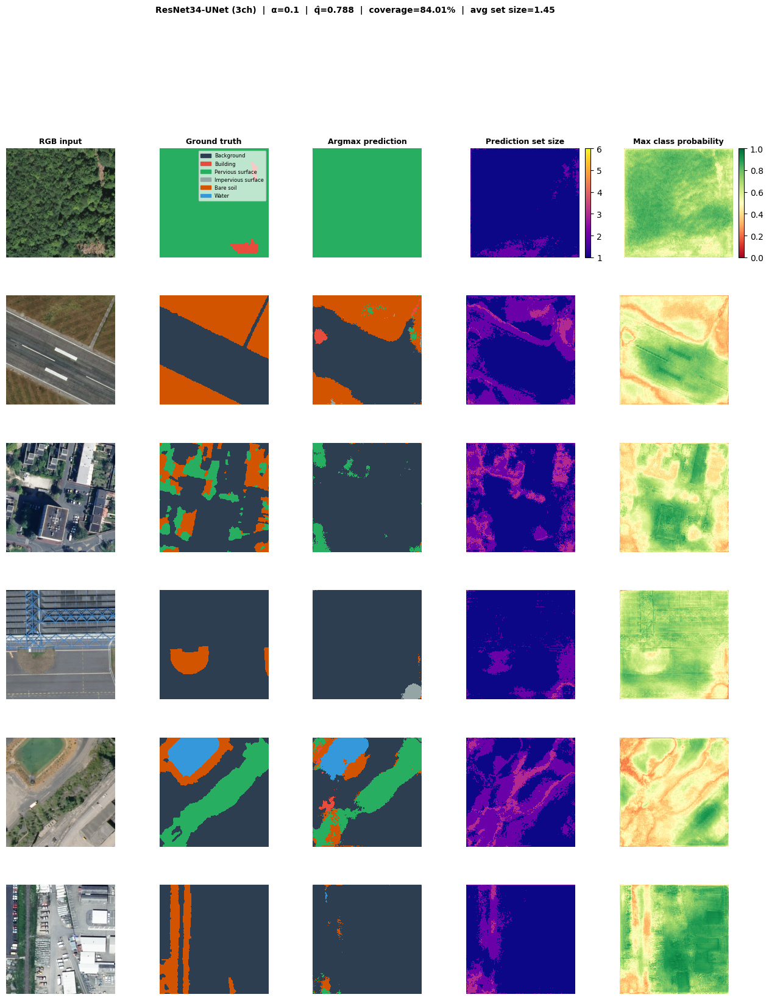

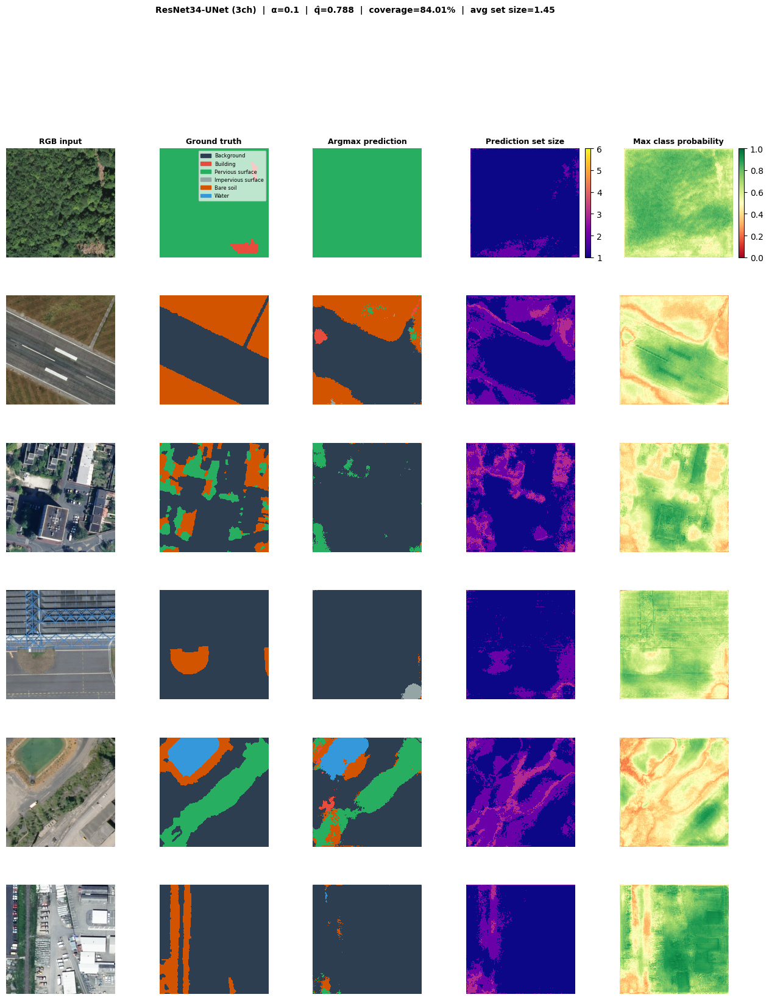

In [ ]:
samples_imgs     = [img  for batch in all_images    for img  in batch]
samples_masks    = [mask for batch in all_masks     for mask in batch]
samples_probs    = [prob for batch in all_probs     for prob in batch]
samples_setsize  = [ss   for batch in set_size_maps for ss   in batch]
samples_predsets = [ps   for batch in pred_set_maps for ps   in batch]

import matplotlib.cm as cm
extra = cm.tab20.colors
while len(PALETTE) < NUM_CLASSES:
    PALETTE.append(extra[len(PALETTE) % len(extra)])

plot_qualitative_grid(samples_imgs, samples_masks, samples_probs, samples_setsize,
                        RGB_CHANNELS, CLASS_NAMES, PALETTE, NUM_CLASSES, VIZ_SAMPLES,
                        model_entry['label'], ALPHA, q_hat, coverage, avg_set_size,
                        VIZ_OUT_DIR, MODEL_KEY, cp_config['visualization']['dpi'])

## ResNet34-UNet 5 Channels

### Load model + data

In [ ]:
MODEL_KEY = "resnet34_unet_5ch"

model_entry = next(m for m in cp_config["models"] if m["name"] == MODEL_KEY)

train_config = sync_class_config(load_config(REPO_ROOT / model_entry["config"]))

# pick only the channels we want (first N channels)
all_channels = list(range(1, 6))
train_config["data"]["channels"] = all_channels[:model_entry["in_channels"]]

print(f"Model : {model_entry['label']}")
print(f"Checkpoint: {model_entry['checkpoint']}")

Model : ResNet34-UNet (5ch)
Checkpoint: outputs/resnet34_unet_5ch_val_IoU/best.pt


In [ ]:
train_loader, val_loader, test_loader = build_dataloaders(train_config["data"])
print(f"Loaders: train={len(train_loader)} val={len(val_loader)} test={len(test_loader)} batches")

# sanity check
batch = next(iter(val_loader))
images, masks = batch["image"], batch["mask"]
print(f"images {images.shape}  masks {masks.shape}  classes {torch.unique(masks).tolist()}")

Loaders: train=25 val=4 test=4 batches
images torch.Size([8, 5, 512, 512])  masks torch.Size([8, 512, 512])  classes [0, 2, 3, 4, 5]


In [ ]:
model = build_model(train_config["model"])

ckpt_path = REPO_ROOT / model_entry["checkpoint"]
checkpoint = torch.load(ckpt_path, map_location=device)
model.load_state_dict(checkpoint["model_state_dict"])
model.to(device).eval()
print("Model loaded")

Model loaded


### Calibration: collect nonconformity scores

In [ ]:
scores = collect_calibration_scores(model, val_loader, NUM_CLASSES, device)
print()
print(f"Calibration pixels: {len(scores):,}")
print(f"Score distribution: min={scores.min():.4f}  mean={scores.mean():.4f}  max={scores.max():.4f}")

Calibrating: 100%|██████████| 4/4 [00:01<00:00,  2.73it/s]


Calibration pixels: 6,553,600
Score distribution: min=0.0324  mean=0.4639  max=0.9971


### Compute q̂

In [ ]:
q_hat = compute_qhat(scores, ALPHA)
threshold = 1.0 - q_hat

print(f"α = {ALPHA}: target coverage = {1-ALPHA:.0%}")
print(f"q̂ = {q_hat:.4f}: inclusion threshold p_c must be greater than equal to {threshold:.4f}")
print()
print("Interpretation:")
print(f"  A class is included in the prediction set when its softmax score is greater than equal to {threshold:.4f}.")
if q_hat > 0.85:
    print("q̂ is high — the model is uncertain. Set sizes will be large.")
elif q_hat < 0.3:
    print("q̂ is low — the model is confident. Sets will be close to size 1.")

α = 0.1: target coverage = 90%
q̂ = 0.7947: inclusion threshold p_c must be greater than equal to 0.2053

Interpretation:
  A class is included in the prediction set when its softmax score is greater than equal to 0.2053.


### test set

In [ ]:
(coverage, avg_set_size, per_class_cov,set_size_maps, pred_set_maps, all_probs, all_images, all_masks) = evaluate_conformal(model, test_loader, q_hat, NUM_CLASSES, device)
print(f"Coverage: {coverage:.2%}")
print(f"Avg set size: {avg_set_size:.2f}")
print(f"Per-class coverage: {per_class_cov}")

Evaluating: 100%|██████████| 4/4 [00:01<00:00,  2.48it/s]

Coverage: 85.24%
Avg set size: 1.44
Per-class coverage: [0.97738609 0.1091772  0.91607871 0.96917447 0.74068689 0.47615339]


### Summary metrics

In [ ]:
print("=" * 52)
print(f"  Model       : {model_entry['label']}")
print(f"  α           : {ALPHA}")
print(f"  q̂           : {q_hat:.4f}")
print(f"  Threshold   : {1-q_hat:.4f}")
print("+" * 52)
print(f"  Target  coverage : {1-ALPHA:.2%}")
print(f"  Empirical coverage: {coverage:.2%}  {'Meets Target' if coverage >= 1-ALPHA else 'Below Target'}")
print(f"  Avg set size : {avg_set_size:.3f} / {NUM_CLASSES} classes")
print("+" * 52)
print("  Per-class coverage:")
for i, (name, cov) in enumerate(zip(CLASS_NAMES, per_class_cov)):
    marker = "Satisfied     - " if cov >= 1-ALPHA else "Not Satisfied - "
    bar = "█" * int(cov * 20)
    print(f"    {marker} {name:25s}  {cov:.2%}  |{bar}")
print("=" * 52)

  Model       : ResNet34-UNet (5ch)
  α           : 0.1
  q̂           : 0.7947
  Threshold   : 0.2053
++++++++++++++++++++++++++++++++++++++++++++++++++++
  Target  coverage : 90.00%
  Empirical coverage: 85.24%  Below Target
  Avg set size : 1.444 / 6 classes
++++++++++++++++++++++++++++++++++++++++++++++++++++
  Per-class coverage:
    Satisfied     -  Background                 97.74%  |███████████████████
    Not Satisfied -  Building                   10.92%  |██
    Satisfied     -  Pervious surface           91.61%  |██████████████████
    Satisfied     -  Impervious surface         96.92%  |███████████████████
    Not Satisfied -  Bare soil                  74.07%  |██████████████
    Not Satisfied -  Water                      47.62%  |█████████


### Visualisation 1 — Score distribution & q̂

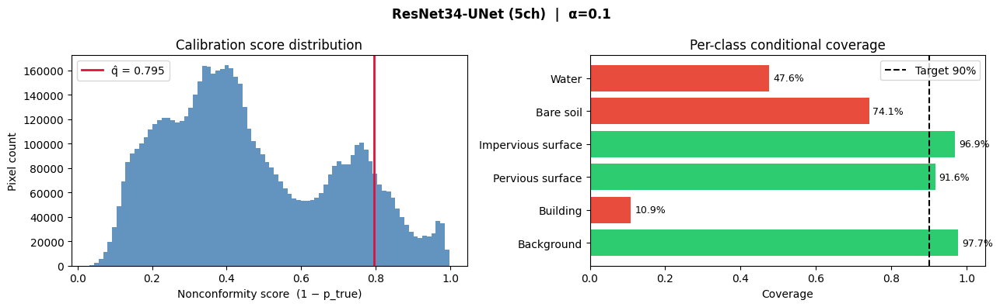

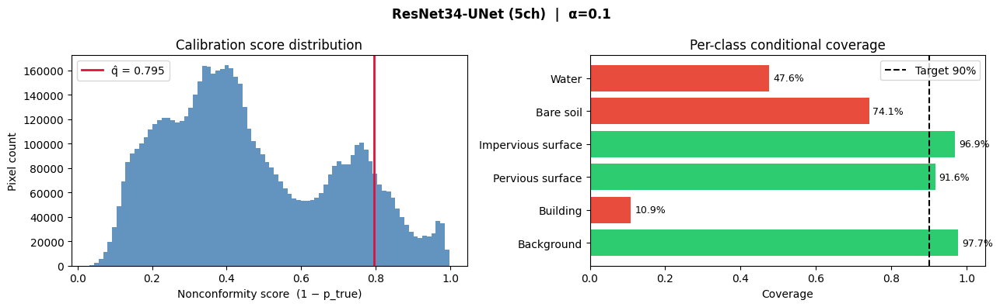

In [ ]:
plot_score_and_coverage_summary(scores, q_hat, ALPHA, per_class_cov, CLASS_NAMES, model_entry['label'], VIZ_OUT_DIR, MODEL_KEY, cp_config['visualization']['dpi'])

### Visualisation 2 — Set size distribution

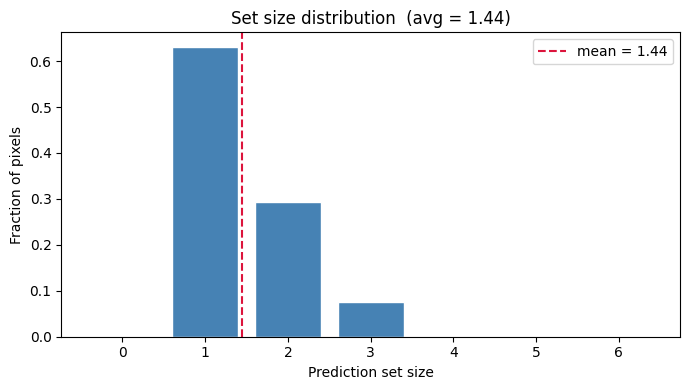

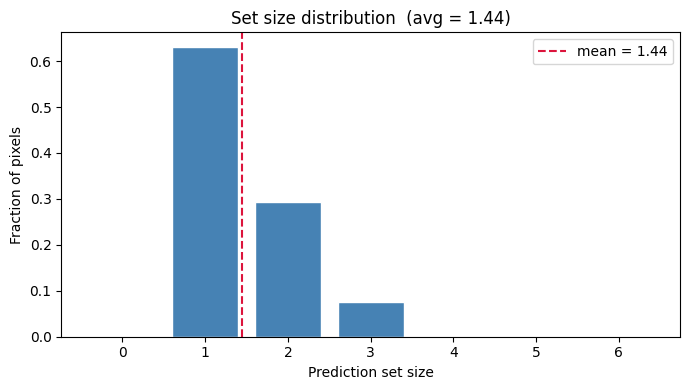

In [ ]:
all_set_sizes = np.concatenate([s.numpy().ravel() for s in set_size_maps])
plot_set_size_distribution(all_set_sizes, NUM_CLASSES, avg_set_size, VIZ_OUT_DIR, MODEL_KEY, cp_config['visualization']['dpi'])

### Visualisation 3 — Qualitative grid: Image | GT | Argmax pred | Set size | Uncertainty

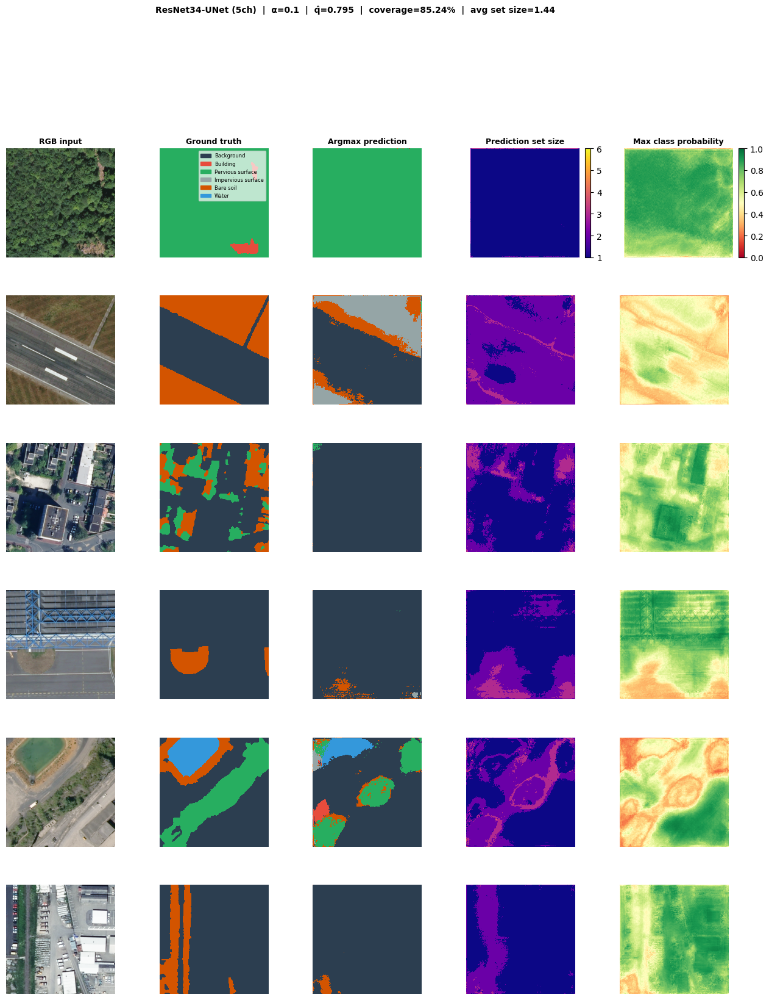

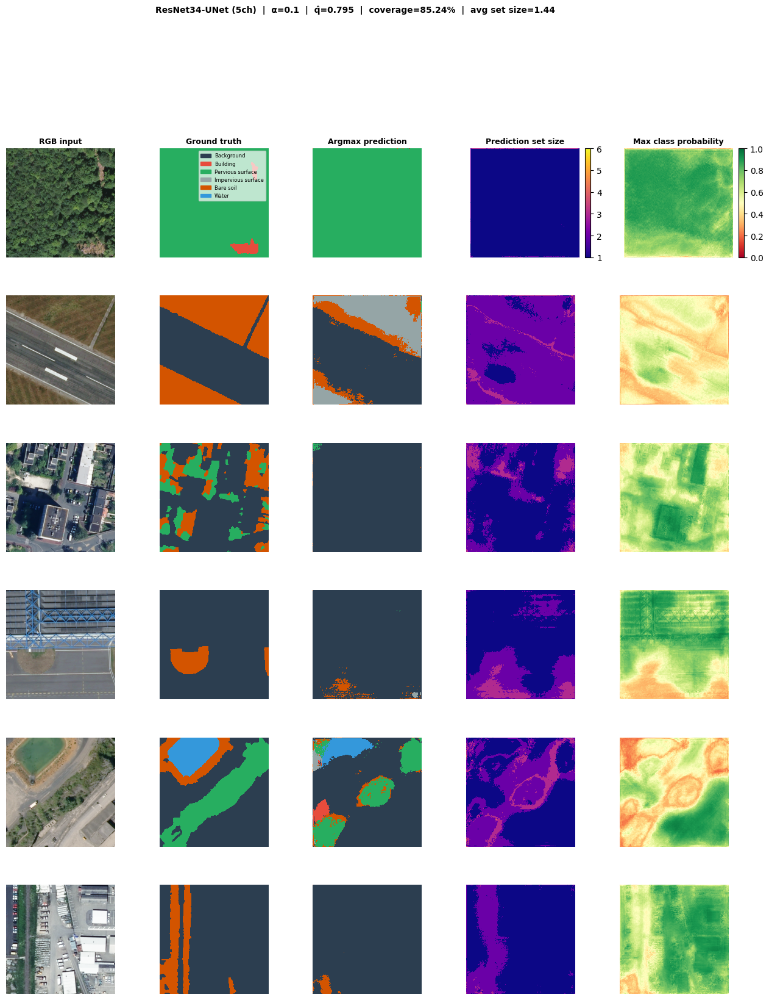

In [ ]:
samples_imgs     = [img  for batch in all_images    for img  in batch]
samples_masks    = [mask for batch in all_masks     for mask in batch]
samples_probs    = [prob for batch in all_probs     for prob in batch]
samples_setsize  = [ss   for batch in set_size_maps for ss   in batch]
samples_predsets = [ps   for batch in pred_set_maps for ps   in batch]

plot_qualitative_grid(samples_imgs, samples_masks, samples_probs, samples_setsize,
                        RGB_CHANNELS, CLASS_NAMES, PALETTE, NUM_CLASSES, VIZ_SAMPLES,
                        model_entry['label'], ALPHA, q_hat, coverage, avg_set_size,
                        VIZ_OUT_DIR, MODEL_KEY, cp_config['visualization']['dpi'])

## ConvNext 3 Channels

### Load model + data

In [ ]:
MODEL_KEY = "convnext_tiny_3ch"

model_entry = next(m for m in cp_config["models"] if m["name"] == MODEL_KEY)

train_config = sync_class_config(load_config(REPO_ROOT / model_entry["config"]))

# pick only the channels we want (first N channels)
all_channels = list(range(1, 6))
train_config["data"]["channels"] = all_channels[:model_entry["in_channels"]]

print(f"Model : {model_entry['label']}")
print(f"Checkpoint: {model_entry['checkpoint']}")

Model : ConvNext-Tiny (3ch)
Checkpoint: outputs/convnext_tiny_3ch_val_IoU/best.pt


In [ ]:
train_loader, val_loader, test_loader = build_dataloaders(train_config["data"])
print(f"Loaders: train={len(train_loader)} val={len(val_loader)} test={len(test_loader)} batches")

# sanity check
batch = next(iter(val_loader))
images, masks = batch["image"], batch["mask"]
print(f"images {images.shape}  masks {masks.shape}  classes {torch.unique(masks).tolist()}")

Loaders: train=25 val=4 test=4 batches
images torch.Size([8, 3, 512, 512])  masks torch.Size([8, 512, 512])  classes [0, 2, 3, 4, 5]


In [ ]:
model = build_model(train_config["model"])

ckpt_path = REPO_ROOT / model_entry["checkpoint"]
checkpoint = torch.load(ckpt_path, map_location=device)
model.load_state_dict(checkpoint["model_state_dict"])
model.to(device).eval()
print("Model loaded")

Model loaded


### Calibration: collect nonconformity scores

In [ ]:
scores = collect_calibration_scores(model, val_loader, NUM_CLASSES, device)
print()
print(f"Calibration pixels: {len(scores):,}")
print(f"Score distribution: min={scores.min():.4f}  mean={scores.mean():.4f}  max={scores.max():.4f}")

Calibrating: 100%|██████████| 4/4 [00:05<00:00,  1.30s/it]


Calibration pixels: 6,553,600
Score distribution: min=0.0032  mean=0.3569  max=1.0000


### Compute q̂

In [ ]:
q_hat = compute_qhat(scores, ALPHA)
threshold = 1.0 - q_hat

print(f"α = {ALPHA}: target coverage = {1-ALPHA:.0%}")
print(f"q̂ = {q_hat:.4f}: inclusion threshold p_c must be greater than equal to {threshold:.4f}")
print()
print("Interpretation:")
print(f"  A class is included in the prediction set when its softmax score is greater than equal to {threshold:.4f}.")
if q_hat > 0.85:
    print("q̂ is high — the model is uncertain. Set sizes will be large.")
elif q_hat < 0.3:
    print("q̂ is low — the model is confident. Sets will be close to size 1.")

α = 0.1: target coverage = 90%
q̂ = 0.7616: inclusion threshold p_c must be greater than equal to 0.2384

Interpretation:
  A class is included in the prediction set when its softmax score is greater than equal to 0.2384.


### Test set

In [ ]:
(coverage, avg_set_size, per_class_cov,set_size_maps, pred_set_maps, all_probs, all_images, all_masks) = evaluate_conformal(model, test_loader, q_hat, NUM_CLASSES, device)
print(f"Coverage: {coverage:.2%}")
print(f"Avg set size: {avg_set_size:.2f}")
print(f"Per-class coverage: {per_class_cov}")

Evaluating: 100%|██████████| 4/4 [00:01<00:00,  2.51it/s]

Coverage: 80.84%
Avg set size: 1.38
Per-class coverage: [0.93108141 0.06029806 0.88063064 0.83126773 0.70899101 0.57187743]


### Summary metrics

In [ ]:
print("=" * 52)
print(f"  Model       : {model_entry['label']}")
print(f"  α           : {ALPHA}")
print(f"  q̂           : {q_hat:.4f}")
print(f"  Threshold   : {1-q_hat:.4f}")
print("+" * 52)
print(f"  Target  coverage : {1-ALPHA:.2%}")
print(f"  Empirical coverage: {coverage:.2%}  {'Meets Target' if coverage >= 1-ALPHA else 'Below Target'}")
print(f"  Avg set size : {avg_set_size:.3f} / {NUM_CLASSES} classes")
print("+" * 52)
print("  Per-class coverage:")
for i, (name, cov) in enumerate(zip(CLASS_NAMES, per_class_cov)):
    marker = "Satisfied     - " if cov >= 1-ALPHA else "Not Satisfied - "
    bar = "█" * int(cov * 20)
    print(f"    {marker} {name:25s}  {cov:.2%}  |{bar}")
print("=" * 52)

  Model       : ConvNext-Tiny (3ch)
  α           : 0.1
  q̂           : 0.7616
  Threshold   : 0.2384
++++++++++++++++++++++++++++++++++++++++++++++++++++
  Target  coverage : 90.00%
  Empirical coverage: 80.84%  Below Target
  Avg set size : 1.377 / 6 classes
++++++++++++++++++++++++++++++++++++++++++++++++++++
  Per-class coverage:
    Satisfied     -  Background                 93.11%  |██████████████████
    Not Satisfied -  Building                   6.03%  |█
    Not Satisfied -  Pervious surface           88.06%  |█████████████████
    Not Satisfied -  Impervious surface         83.13%  |████████████████
    Not Satisfied -  Bare soil                  70.90%  |██████████████
    Not Satisfied -  Water                      57.19%  |███████████


### Score distribution & q̂

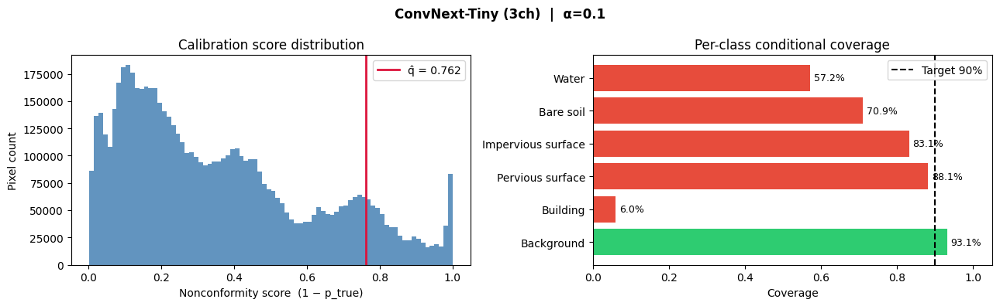

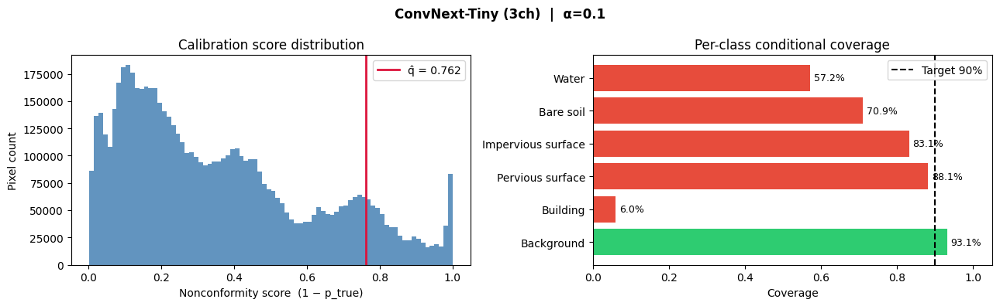

In [ ]:
plot_score_and_coverage_summary(scores, q_hat, ALPHA, per_class_cov, CLASS_NAMES, model_entry['label'], VIZ_OUT_DIR, MODEL_KEY, cp_config['visualization']['dpi'])

### Set size distribution

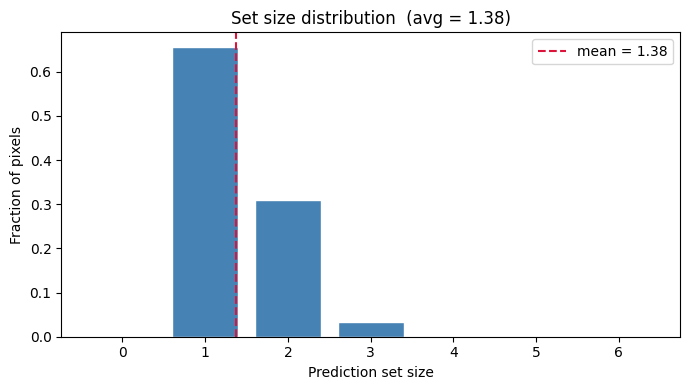

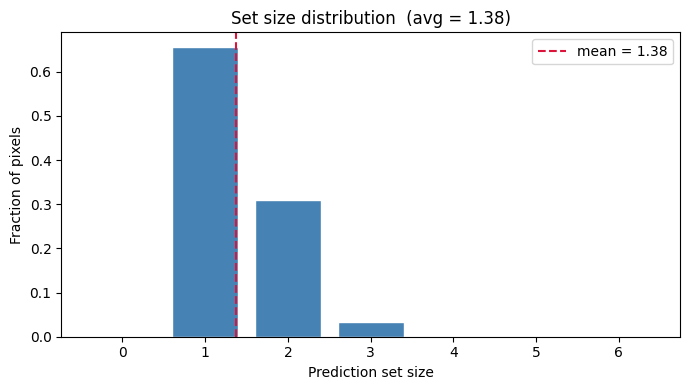

In [ ]:
all_set_sizes = np.concatenate([s.numpy().ravel() for s in set_size_maps])
plot_set_size_distribution(all_set_sizes, NUM_CLASSES, avg_set_size, VIZ_OUT_DIR, MODEL_KEY, cp_config['visualization']['dpi'])

### Qualitative grid: Image | GT | Argmax pred | Set size | Uncertainty

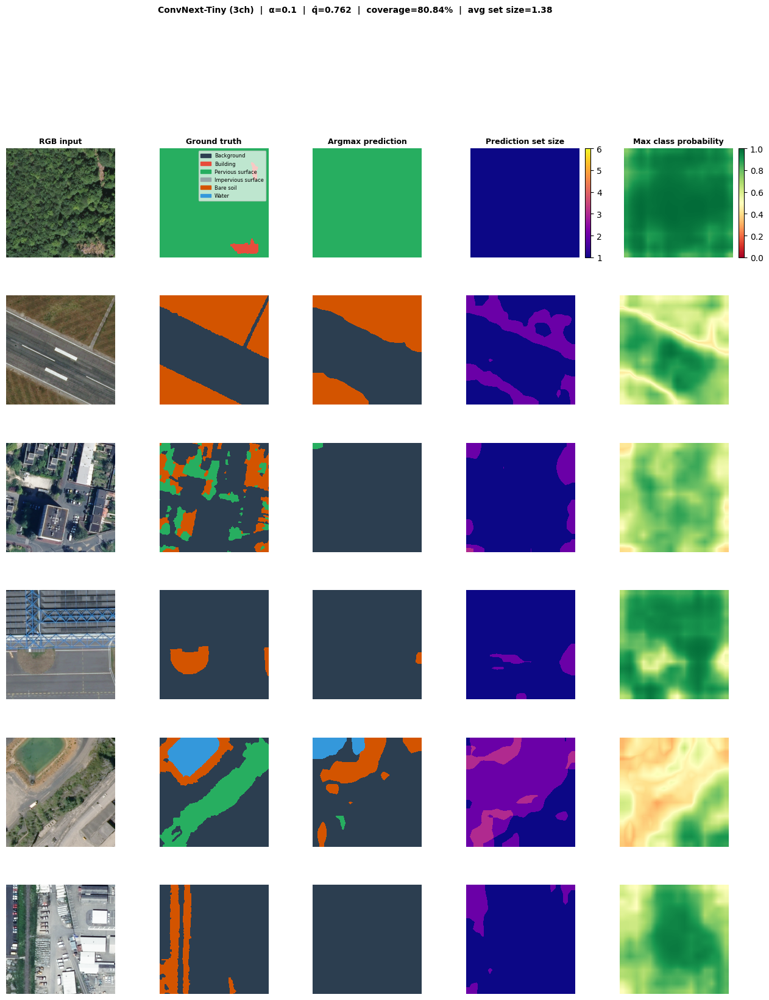

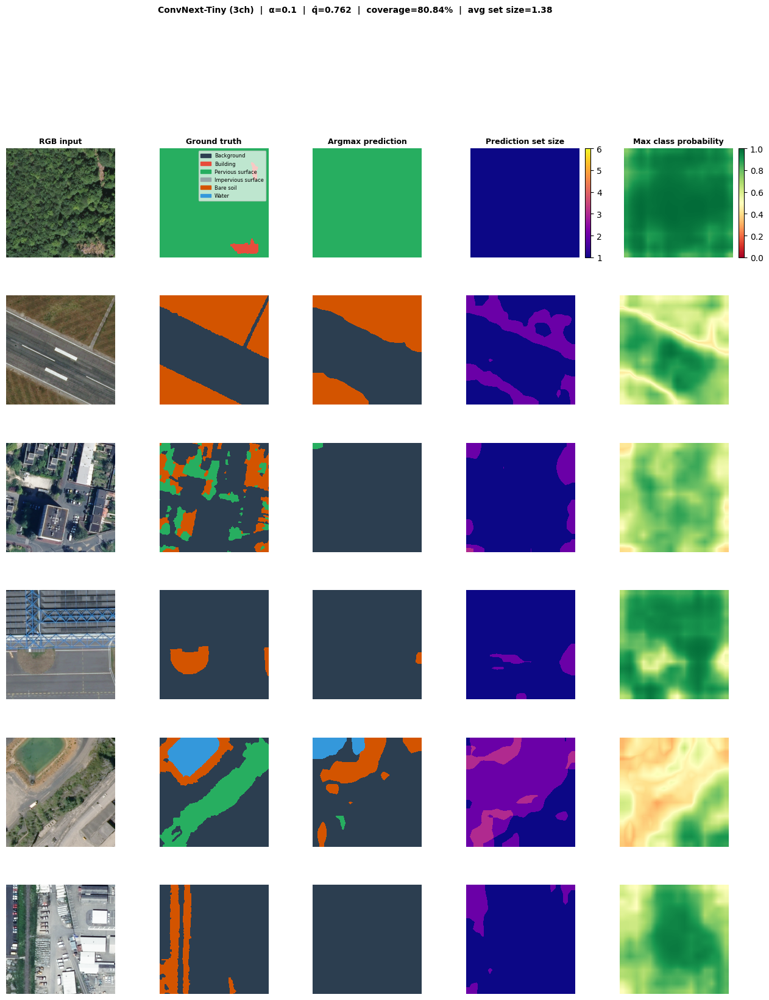

In [ ]:
samples_imgs     = [img  for batch in all_images    for img  in batch]
samples_masks    = [mask for batch in all_masks     for mask in batch]
samples_probs    = [prob for batch in all_probs     for prob in batch]
samples_setsize  = [ss   for batch in set_size_maps for ss   in batch]
samples_predsets = [ps   for batch in pred_set_maps for ps   in batch] # Not directly used by plot_qualitative_grid, but good to keep if needed later

plot_qualitative_grid(samples_imgs, samples_masks, samples_probs, samples_setsize,
                        RGB_CHANNELS, CLASS_NAMES, PALETTE, NUM_CLASSES, VIZ_SAMPLES,
                        model_entry['label'], ALPHA, q_hat, coverage, avg_set_size,
                        VIZ_OUT_DIR, MODEL_KEY, cp_config['visualization']['dpi'])

## ConvNext 5 Channels

### Load model + data

In [ ]:
MODEL_KEY = "convnext_tiny_5ch"

model_entry = next(m for m in cp_config["models"] if m["name"] == MODEL_KEY)

train_config = sync_class_config(load_config(REPO_ROOT / model_entry["config"]))

# pick only the channels we want (first N channels)
all_channels = list(range(1, 6))
train_config["data"]["channels"] = all_channels[:model_entry["in_channels"]]

print(f"Model : {model_entry['label']}")
print(f"Checkpoint: {model_entry['checkpoint']}")

Model : ConvNext-Tiny (5ch)
Checkpoint: outputs/convnext_tiny_5ch_val_IoU/best.pt


In [ ]:
train_loader, val_loader, test_loader = build_dataloaders(train_config["data"])
print(f"Loaders: train={len(train_loader)} val={len(val_loader)} test={len(test_loader)} batches")

# sanity check
batch = next(iter(val_loader))
images, masks = batch["image"], batch["mask"]
print(f"images {images.shape}  masks {masks.shape}  classes {torch.unique(masks).tolist()}")

Loaders: train=25 val=4 test=4 batches
images torch.Size([8, 5, 512, 512])  masks torch.Size([8, 512, 512])  classes [0, 2, 3, 4, 5]


In [ ]:
model = build_model(train_config["model"])

ckpt_path = REPO_ROOT / model_entry["checkpoint"]
checkpoint = torch.load(ckpt_path, map_location=device)
model.load_state_dict(checkpoint["model_state_dict"])
model.to(device).eval()
print("Model loaded")

Model loaded


### Calibration: collect nonconformity scores

In [ ]:
scores = collect_calibration_scores(model, val_loader, NUM_CLASSES, device)
print()
print(f"Calibration pixels: {len(scores):,}")
print(f"Score distribution: min={scores.min():.4f}  mean={scores.mean():.4f}  max={scores.max():.4f}")

Calibrating: 100%|██████████| 4/4 [00:01<00:00,  2.74it/s]


Calibration pixels: 6,553,600
Score distribution: min=0.0074  mean=0.3799  max=0.9998


### Compute q̂

In [ ]:
q_hat = compute_qhat(scores, ALPHA)
threshold = 1.0 - q_hat

print(f"α = {ALPHA}: target coverage = {1-ALPHA:.0%}")
print(f"q̂ = {q_hat:.4f}: inclusion threshold p_c must be greater than equal to {threshold:.4f}")
print()
print("Interpretation:")
print(f"  A class is included in the prediction set when its softmax score is greater than equal to {threshold:.4f}.")
if q_hat > 0.85:
    print("q̂ is high — the model is uncertain. Set sizes will be large.")
elif q_hat < 0.3:
    print("q̂ is low — the model is confident. Sets will be close to size 1.")

α = 0.1: target coverage = 90%
q̂ = 0.7836: inclusion threshold p_c must be greater than equal to 0.2164

Interpretation:
  A class is included in the prediction set when its softmax score is greater than equal to 0.2164.


### Test set

In [ ]:
(coverage, avg_set_size, per_class_cov,set_size_maps, pred_set_maps, all_probs, all_images, all_masks) = evaluate_conformal(model, test_loader, q_hat, NUM_CLASSES, device)
print(f"Coverage: {coverage:.2%}")
print(f"Avg set size: {avg_set_size:.2f}")
print(f"Per-class coverage: {per_class_cov}")

Evaluating: 100%|██████████| 4/4 [00:01<00:00,  2.38it/s]

Coverage: 84.99%
Avg set size: 1.52
Per-class coverage: [0.97514951 0.34449021 0.88354484 0.82333453 0.82724653 0.51000905]


### Summary metrics

In [ ]:
print("=" * 52)
print(f"  Model       : {model_entry['label']}")
print(f"  α           : {ALPHA}")
print(f"  q̂           : {q_hat:.4f}")
print(f"  Threshold   : {1-q_hat:.4f}")
print("+" * 52)
print(f"  Target  coverage : {1-ALPHA:.2%}")
print(f"  Empirical coverage: {coverage:.2%}  {'Meets Target' if coverage >= 1-ALPHA else 'Below Target'}")
print(f"  Avg set size : {avg_set_size:.3f} / {NUM_CLASSES} classes")
print("+" * 52)
print("  Per-class coverage:")
for i, (name, cov) in enumerate(zip(CLASS_NAMES, per_class_cov)):
    marker = "Satisfied     - " if cov >= 1-ALPHA else "Not Satisfied - "
    bar = "█" * int(cov * 20)
    print(f"    {marker} {name:25s}  {cov:.2%}  |{bar}")
print("=" * 52)

  Model       : ConvNext-Tiny (5ch)
  α           : 0.1
  q̂           : 0.7836
  Threshold   : 0.2164
++++++++++++++++++++++++++++++++++++++++++++++++++++
  Target  coverage : 90.00%
  Empirical coverage: 84.99%  Below Target
  Avg set size : 1.523 / 6 classes
++++++++++++++++++++++++++++++++++++++++++++++++++++
  Per-class coverage:
    Satisfied     -  Background                 97.51%  |███████████████████
    Not Satisfied -  Building                   34.45%  |██████
    Not Satisfied -  Pervious surface           88.35%  |█████████████████
    Not Satisfied -  Impervious surface         82.33%  |████████████████
    Not Satisfied -  Bare soil                  82.72%  |████████████████
    Not Satisfied -  Water                      51.00%  |██████████


### Score distribution & q̂

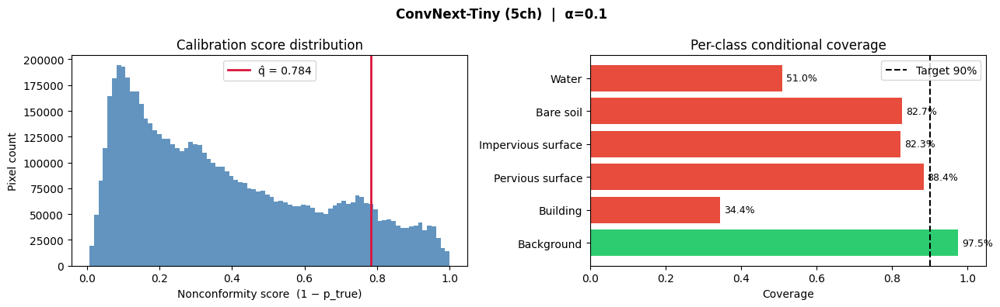

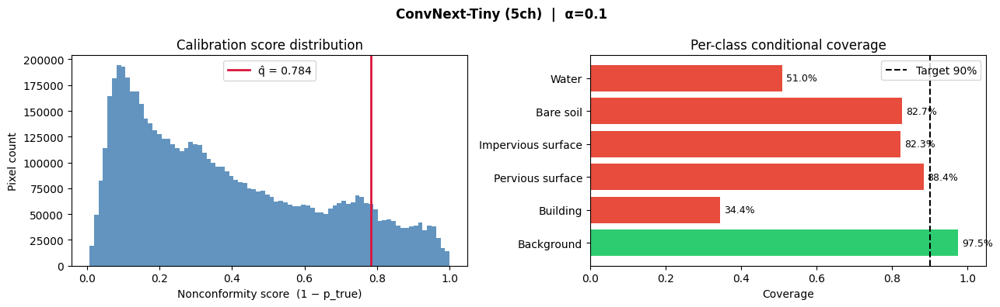

In [ ]:
plot_score_and_coverage_summary(scores, q_hat, ALPHA, per_class_cov, CLASS_NAMES, model_entry['label'], VIZ_OUT_DIR, MODEL_KEY, cp_config['visualization']['dpi'])

### Set size distribution

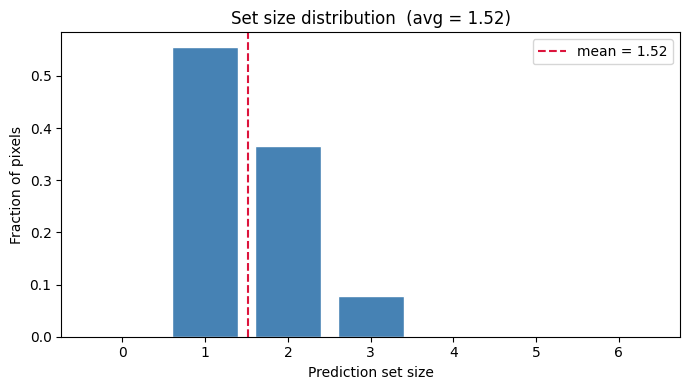

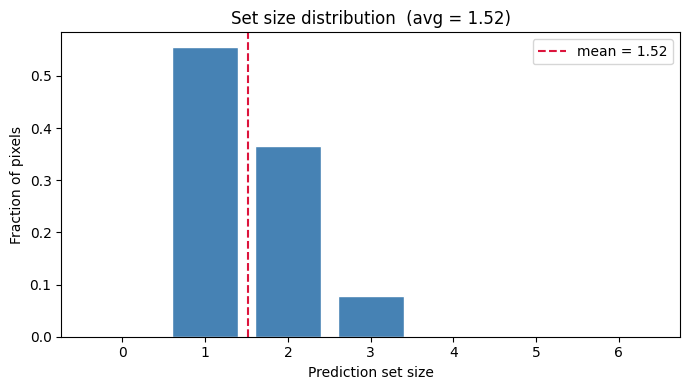

In [ ]:
all_set_sizes = np.concatenate([s.numpy().ravel() for s in set_size_maps])
plot_set_size_distribution(all_set_sizes, NUM_CLASSES, avg_set_size, VIZ_OUT_DIR, MODEL_KEY, cp_config['visualization']['dpi'])

### Qualitative grid: Image | GT | Argmax pred | Set size | Uncertainty

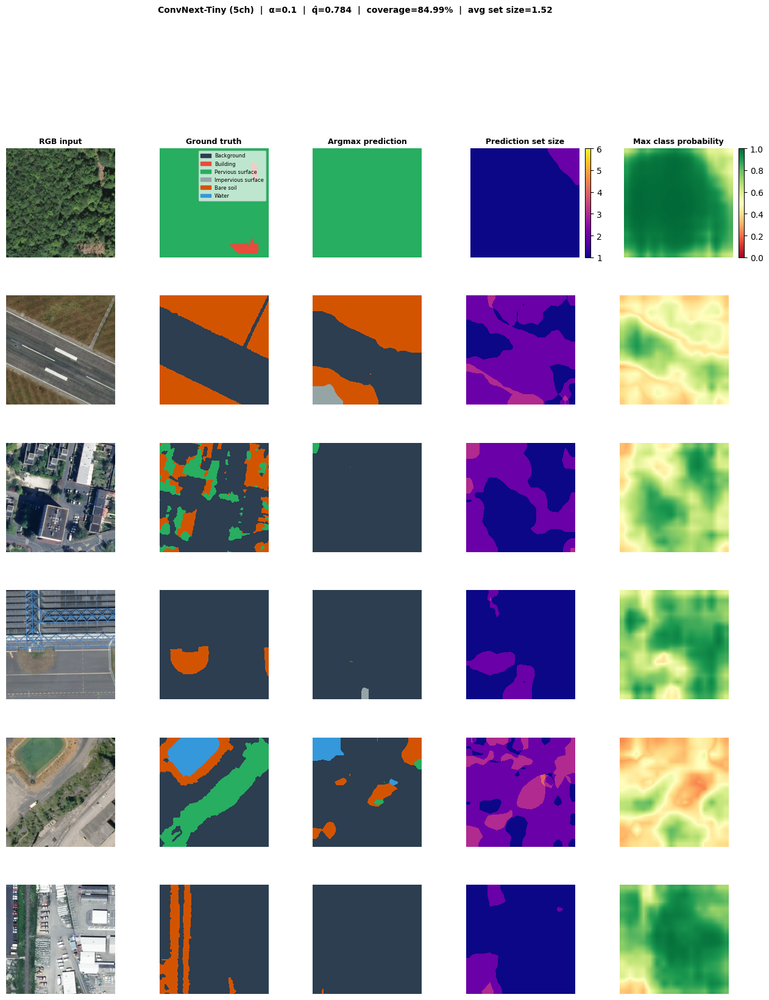

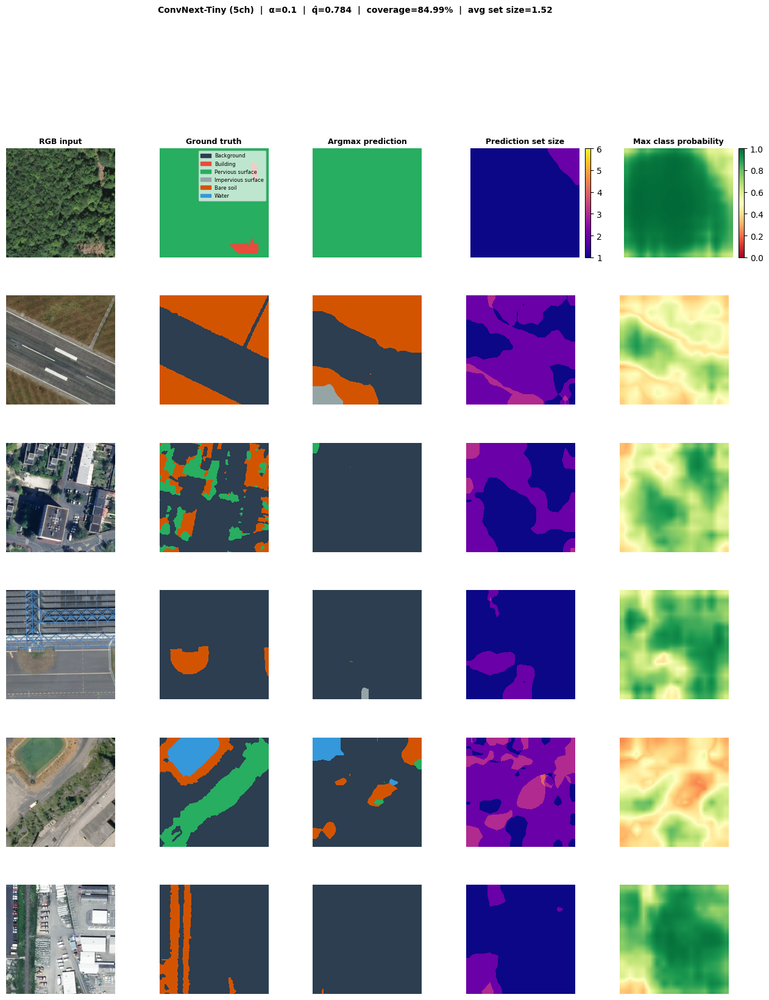

In [ ]:
samples_imgs     = [img  for batch in all_images    for img  in batch]
samples_masks    = [mask for batch in all_masks     for mask in batch]
samples_probs    = [prob for batch in all_probs     for prob in batch]
samples_setsize  = [ss   for batch in set_size_maps for ss   in batch]
samples_predsets = [ps   for batch in pred_set_maps for ps   in batch] # Not directly used by plot_qualitative_grid, but good to keep if needed later

plot_qualitative_grid(samples_imgs, samples_masks, samples_probs, samples_setsize,
                        RGB_CHANNELS, CLASS_NAMES, PALETTE, NUM_CLASSES, VIZ_SAMPLES,
                        model_entry['label'], ALPHA, q_hat, coverage, avg_set_size,
                        VIZ_OUT_DIR, MODEL_KEY, cp_config['visualization']['dpi'])

## DinoV3 - ConvNext 3 Channels

### Load model + data

In [ ]:
MODEL_KEY = "dinov3_convnext_3ch"

model_entry = next(m for m in cp_config["models"] if m["name"] == MODEL_KEY)

train_config = sync_class_config(load_config(REPO_ROOT / model_entry["config"]))

# pick only the channels we want (first N channels)
all_channels = list(range(1, 6))
train_config["data"]["channels"] = all_channels[:model_entry["in_channels"]]

print(f"Model : {model_entry['label']}")
print(f"Checkpoint: {model_entry['checkpoint']}")

Model : DINOv3-ConvNext-Tiny (3ch)
Checkpoint: outputs/dinov3_convnext_tiny_3ch_val_IoU/best.pt


In [ ]:
train_loader, val_loader, test_loader = build_dataloaders(train_config["data"])
print(f"Loaders: train={len(train_loader)} val={len(val_loader)} test={len(test_loader)} batches")

# sanity check
batch = next(iter(val_loader))
images, masks = batch["image"], batch["mask"]
print(f"images {images.shape}  masks {masks.shape}  classes {torch.unique(masks).tolist()}")

Loaders: train=25 val=4 test=4 batches
images torch.Size([8, 3, 512, 512])  masks torch.Size([8, 512, 512])  classes [0, 2, 3, 4, 5]


In [ ]:
model = build_model(train_config["model"])

ckpt_path = REPO_ROOT / model_entry["checkpoint"]
checkpoint = torch.load(ckpt_path, map_location=device)
model.load_state_dict(checkpoint["model_state_dict"])
model.to(device).eval()
print("Model loaded")

Loading weights:   0%|          | 0/180 [00:00<?, ?it/s]

Model loaded


### Calibration: collect nonconformity scores

In [ ]:
scores = collect_calibration_scores(model, val_loader, NUM_CLASSES, device)
print()
print(f"Calibration pixels: {len(scores):,}")
print(f"Score distribution: min={scores.min():.4f}  mean={scores.mean():.4f}  max={scores.max():.4f}")

Calibrating: 100%|██████████| 4/4 [00:01<00:00,  2.75it/s]


Calibration pixels: 6,553,600
Score distribution: min=0.0012  mean=0.3069  max=1.0000


### Compute q̂

In [ ]:
q_hat = compute_qhat(scores, ALPHA)
threshold = 1.0 - q_hat

print(f"α = {ALPHA}: target coverage = {1-ALPHA:.0%}")
print(f"q̂ = {q_hat:.4f}: inclusion threshold p_c must be greater than equal to {threshold:.4f}")
print()
print("Interpretation:")
print(f"  A class is included in the prediction set when its softmax score is greater than equal to {threshold:.4f}.")
if q_hat > 0.85:
    print("q̂ is high — the model is uncertain. Set sizes will be large.")
elif q_hat < 0.3:
    print("q̂ is low — the model is confident. Sets will be close to size 1.")

α = 0.1: target coverage = 90%
q̂ = 0.7559: inclusion threshold p_c must be greater than equal to 0.2441

Interpretation:
  A class is included in the prediction set when its softmax score is greater than equal to 0.2441.


### Test set

In [ ]:
(coverage, avg_set_size, per_class_cov,set_size_maps, pred_set_maps, all_probs, all_images, all_masks) = evaluate_conformal(model, test_loader, q_hat, NUM_CLASSES, device)
print(f"Coverage: {coverage:.2%}")
print(f"Avg set size: {avg_set_size:.2f}")
print(f"Per-class coverage: {per_class_cov}")

Evaluating: 100%|██████████| 4/4 [00:01<00:00,  2.85it/s]

Coverage: 84.27%
Avg set size: 1.42
Per-class coverage: [0.97811685 0.23255239 0.900739   0.83860288 0.63996484 0.81274505]


### Summary metrics

In [ ]:
print("=" * 52)
print(f"  Model       : {model_entry['label']}")
print(f"  α           : {ALPHA}")
print(f"  q̂           : {q_hat:.4f}")
print(f"  Threshold   : {1-q_hat:.4f}")
print("+" * 52)
print(f"  Target  coverage : {1-ALPHA:.2%}")
print(f"  Empirical coverage: {coverage:.2%}  {'Meets Target' if coverage >= 1-ALPHA else 'Below Target'}")
print(f"  Avg set size : {avg_set_size:.3f} / {NUM_CLASSES} classes")
print("+" * 52)
print("  Per-class coverage:")
for i, (name, cov) in enumerate(zip(CLASS_NAMES, per_class_cov)):
    marker = "Satisfied     - " if cov >= 1-ALPHA else "Not Satisfied - "
    bar = "█" * int(cov * 20)
    print(f"    {marker} {name:25s}  {cov:.2%}  |{bar}")
print("=" * 52)

  Model       : DINOv3-ConvNext-Tiny (3ch)
  α           : 0.1
  q̂           : 0.7559
  Threshold   : 0.2441
++++++++++++++++++++++++++++++++++++++++++++++++++++
  Target  coverage : 90.00%
  Empirical coverage: 84.27%  Below Target
  Avg set size : 1.423 / 6 classes
++++++++++++++++++++++++++++++++++++++++++++++++++++
  Per-class coverage:
    Satisfied     -  Background                 97.81%  |███████████████████
    Not Satisfied -  Building                   23.26%  |████
    Satisfied     -  Pervious surface           90.07%  |██████████████████
    Not Satisfied -  Impervious surface         83.86%  |████████████████
    Not Satisfied -  Bare soil                  64.00%  |████████████
    Not Satisfied -  Water                      81.27%  |████████████████


### Score distribution & q̂

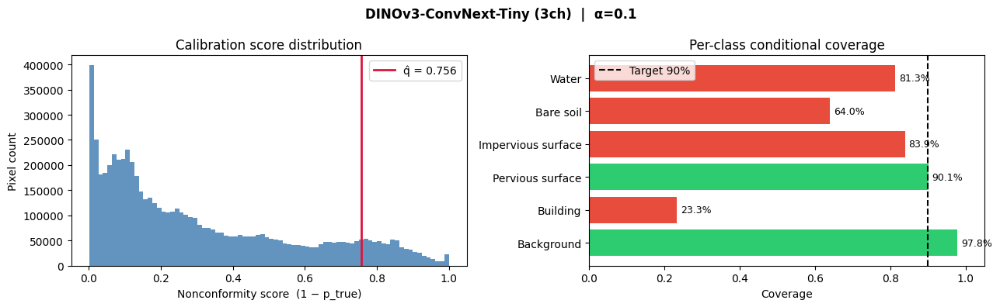

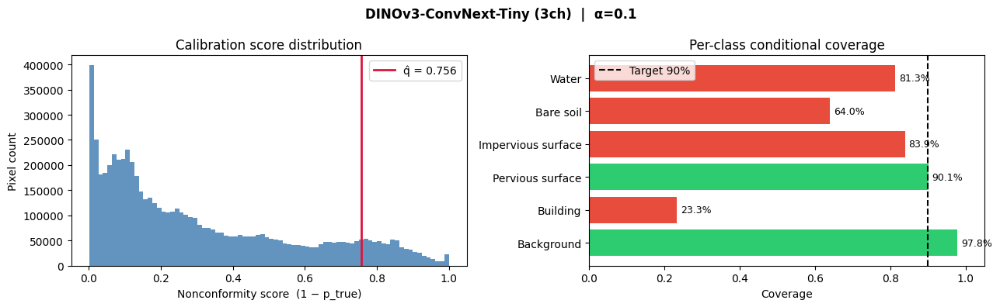

In [ ]:
plot_score_and_coverage_summary(scores, q_hat, ALPHA, per_class_cov, CLASS_NAMES, model_entry['label'], VIZ_OUT_DIR, MODEL_KEY, cp_config['visualization']['dpi'])

### Set size distribution

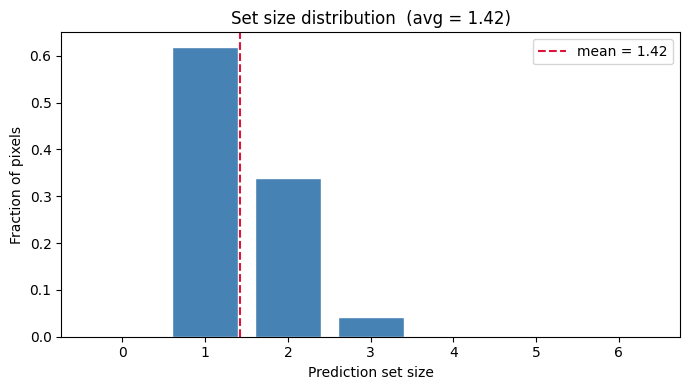

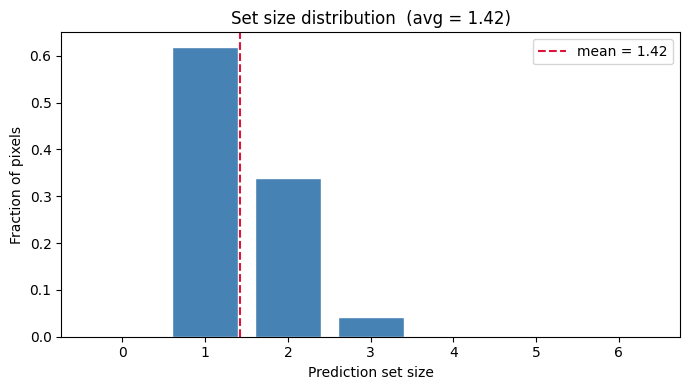

In [ ]:
all_set_sizes = np.concatenate([s.numpy().ravel() for s in set_size_maps])
plot_set_size_distribution(all_set_sizes, NUM_CLASSES, avg_set_size, VIZ_OUT_DIR, MODEL_KEY, cp_config['visualization']['dpi'])

### Qualitative grid: Image | GT | Argmax pred | Set size | Uncertainty

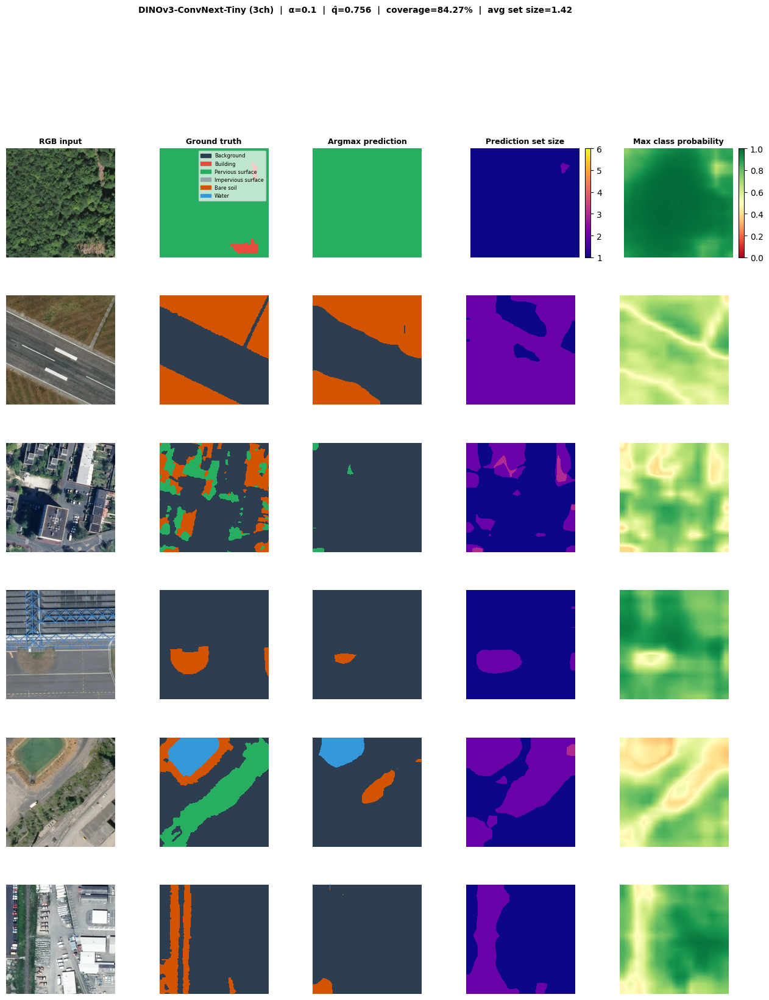

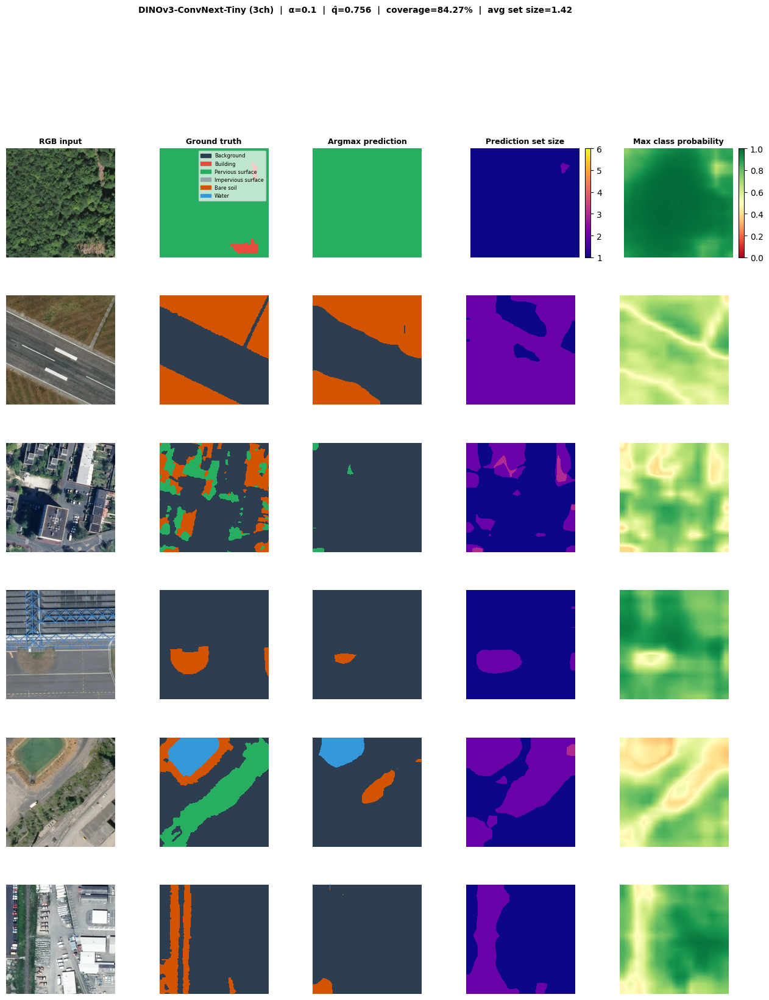

In [ ]:
samples_imgs     = [img  for batch in all_images    for img  in batch]
samples_masks    = [mask for batch in all_masks     for mask in batch]
samples_probs    = [prob for batch in all_probs     for prob in batch]
samples_setsize  = [ss   for batch in set_size_maps for ss   in batch]
samples_predsets = [ps   for batch in pred_set_maps for ps   in batch] # Not directly used by plot_qualitative_grid, but good to keep if needed later

plot_qualitative_grid(samples_imgs, samples_masks, samples_probs, samples_setsize,
                        RGB_CHANNELS, CLASS_NAMES, PALETTE, NUM_CLASSES, VIZ_SAMPLES,
                        model_entry['label'], ALPHA, q_hat, coverage, avg_set_size,
                        VIZ_OUT_DIR, MODEL_KEY, cp_config['visualization']['dpi'])

## DinoV3 - ConvNext 5 Channels

### Load model + data

In [ ]:
MODEL_KEY = "dinov3_convnext_5ch"

model_entry = next(m for m in cp_config["models"] if m["name"] == MODEL_KEY)

train_config = sync_class_config(load_config(REPO_ROOT / model_entry["config"]))

# pick only the channels we want (first N channels)
all_channels = list(range(1, 6))
train_config["data"]["channels"] = all_channels[:model_entry["in_channels"]]

print(f"Model : {model_entry['label']}")
print(f"Checkpoint: {model_entry['checkpoint']}")

Model : DINOv3-ConvNext-Tiny (5ch)
Checkpoint: outputs/dinov3_convnext_tiny_5ch_val_IoU/best.pt


In [ ]:
train_loader, val_loader, test_loader = build_dataloaders(train_config["data"])
print(f"Loaders: train={len(train_loader)} val={len(val_loader)} test={len(test_loader)} batches")

# sanity check
batch = next(iter(val_loader))
images, masks = batch["image"], batch["mask"]
print(f"images {images.shape}  masks {masks.shape}  classes {torch.unique(masks).tolist()}")

Loaders: train=25 val=4 test=4 batches
images torch.Size([8, 5, 512, 512])  masks torch.Size([8, 512, 512])  classes [0, 2, 3, 4, 5]


In [ ]:
model = build_model(train_config["model"])

ckpt_path = REPO_ROOT / model_entry["checkpoint"]
checkpoint = torch.load(ckpt_path, map_location=device)
model.load_state_dict(checkpoint["model_state_dict"])
model.to(device).eval()
print("Model loaded")

Loading weights:   0%|          | 0/180 [00:00<?, ?it/s]

Model loaded


### Calibration: collect nonconformity scores

In [ ]:
scores = collect_calibration_scores(model, val_loader, NUM_CLASSES, device)
print()
print(f"Calibration pixels: {len(scores):,}")
print(f"Score distribution: min={scores.min():.4f}  mean={scores.mean():.4f}  max={scores.max():.4f}")

Calibrating: 100%|██████████| 4/4 [00:01<00:00,  2.77it/s]


Calibration pixels: 6,553,600
Score distribution: min=0.0097  mean=0.3640  max=0.9998


### Compute q̂

In [ ]:
q_hat = compute_qhat(scores, ALPHA)
threshold = 1.0 - q_hat

print(f"α = {ALPHA}: target coverage = {1-ALPHA:.0%}")
print(f"q̂ = {q_hat:.4f}: inclusion threshold p_c must be greater than equal to {threshold:.4f}")
print()
print("Interpretation:")
print(f"  A class is included in the prediction set when its softmax score is greater than equal to {threshold:.4f}.")
if q_hat > 0.85:
    print("q̂ is high — the model is uncertain. Set sizes will be large.")
elif q_hat < 0.3:
    print("q̂ is low — the model is confident. Sets will be close to size 1.")

α = 0.1: target coverage = 90%
q̂ = 0.7967: inclusion threshold p_c must be greater than equal to 0.2033

Interpretation:
  A class is included in the prediction set when its softmax score is greater than equal to 0.2033.


### Test set

In [ ]:
(coverage, avg_set_size, per_class_cov,set_size_maps, pred_set_maps, all_probs, all_images, all_masks) = evaluate_conformal(model, test_loader, q_hat, NUM_CLASSES, device)
print(f"Coverage: {coverage:.2%}")
print(f"Avg set size: {avg_set_size:.2f}")
print(f"Per-class coverage: {per_class_cov}")

Evaluating: 100%|██████████| 4/4 [00:01<00:00,  2.43it/s]

Coverage: 87.67%
Avg set size: 1.45
Per-class coverage: [0.98070627 0.48689076 0.95924525 0.9555213  0.53304938 0.95226627]


### Summary metrics

In [ ]:
print("=" * 52)
print(f"  Model       : {model_entry['label']}")
print(f"  α           : {ALPHA}")
print(f"  q̂           : {q_hat:.4f}")
print(f"  Threshold   : {1-q_hat:.4f}")
print("+" * 52)
print(f"  Target  coverage : {1-ALPHA:.2%}")
print(f"  Empirical coverage: {coverage:.2%}  {'Meets Target' if coverage >= 1-ALPHA else 'Below Target'}")
print(f"  Avg set size : {avg_set_size:.3f} / {NUM_CLASSES} classes")
print("+" * 52)
print("  Per-class coverage:")
for i, (name, cov) in enumerate(zip(CLASS_NAMES, per_class_cov)):
    marker = "Satisfied     - " if cov >= 1-ALPHA else "Not Satisfied - "
    bar = "█" * int(cov * 20)
    print(f"    {marker} {name:25s}  {cov:.2%}  |{bar}")
print("=" * 52)

  Model       : DINOv3-ConvNext-Tiny (5ch)
  α           : 0.1
  q̂           : 0.7967
  Threshold   : 0.2033
++++++++++++++++++++++++++++++++++++++++++++++++++++
  Target  coverage : 90.00%
  Empirical coverage: 87.67%  Below Target
  Avg set size : 1.450 / 6 classes
++++++++++++++++++++++++++++++++++++++++++++++++++++
  Per-class coverage:
    Satisfied     -  Background                 98.07%  |███████████████████
    Not Satisfied -  Building                   48.69%  |█████████
    Satisfied     -  Pervious surface           95.92%  |███████████████████
    Satisfied     -  Impervious surface         95.55%  |███████████████████
    Not Satisfied -  Bare soil                  53.30%  |██████████
    Satisfied     -  Water                      95.23%  |███████████████████


### Score distribution & q̂

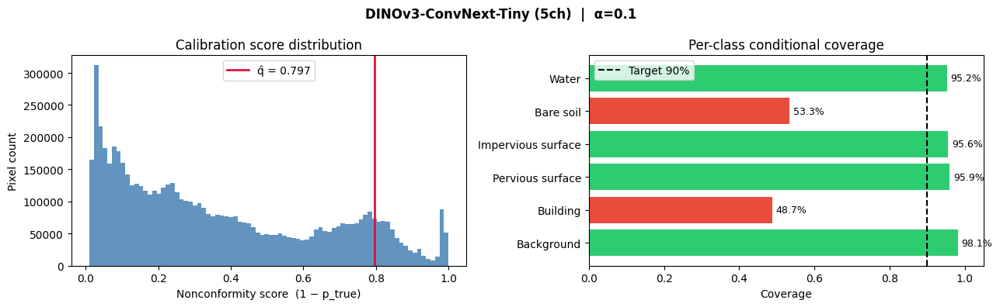

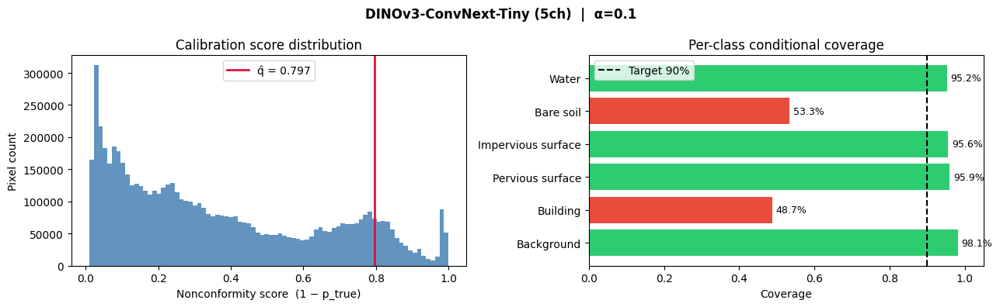

In [ ]:
plot_score_and_coverage_summary(scores, q_hat, ALPHA, per_class_cov, CLASS_NAMES, model_entry['label'], VIZ_OUT_DIR, MODEL_KEY, cp_config['visualization']['dpi'])

### Set size distribution

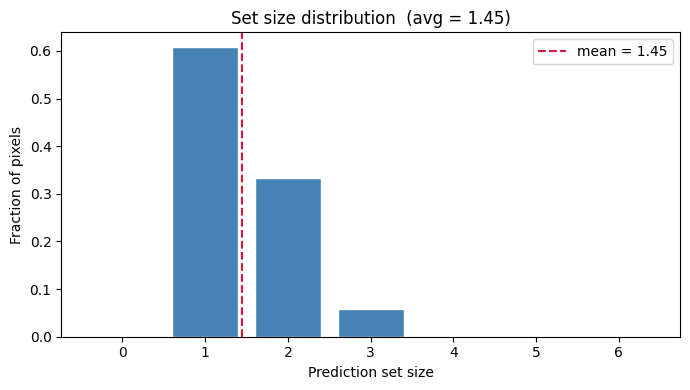

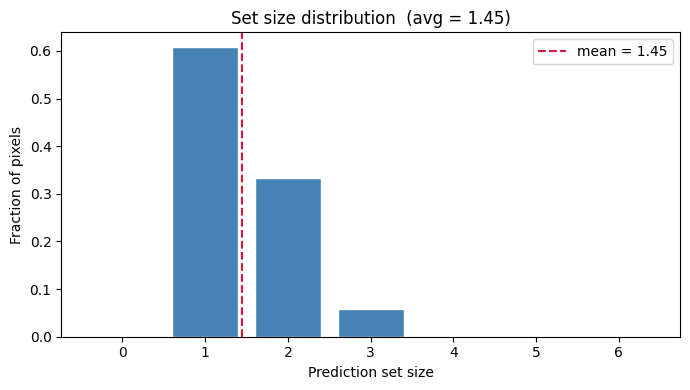

In [ ]:
all_set_sizes = np.concatenate([s.numpy().ravel() for s in set_size_maps])
plot_set_size_distribution(all_set_sizes, NUM_CLASSES, avg_set_size, VIZ_OUT_DIR, MODEL_KEY, cp_config['visualization']['dpi'])

### Qualitative grid: Image | GT | Argmax pred | Set size | Uncertainty

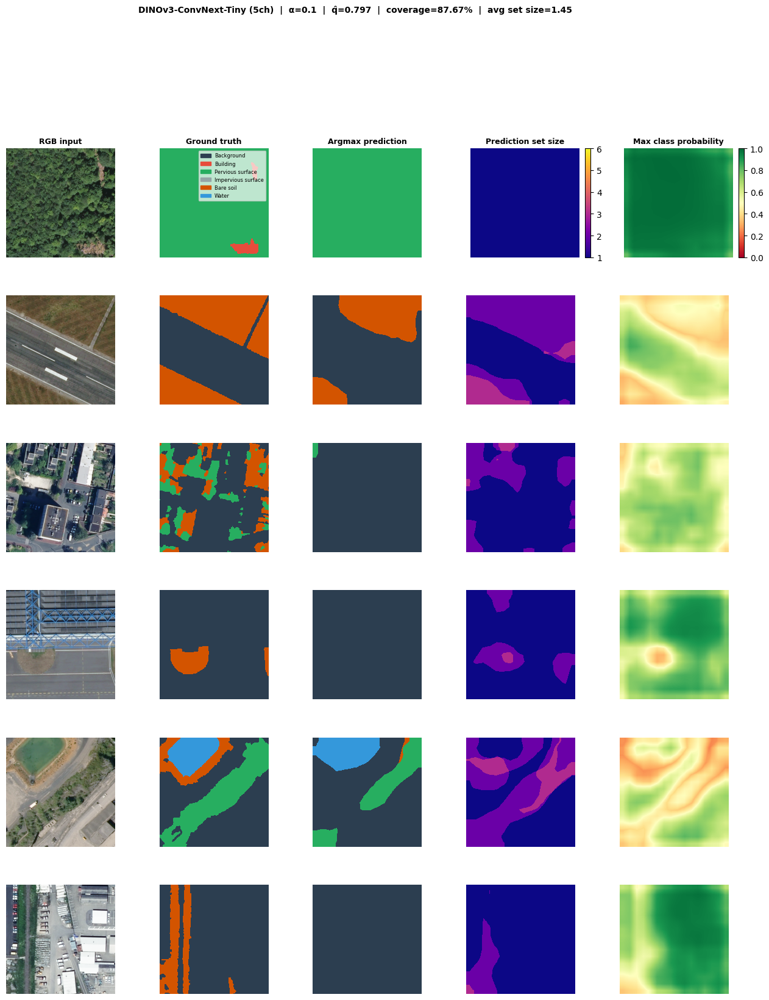

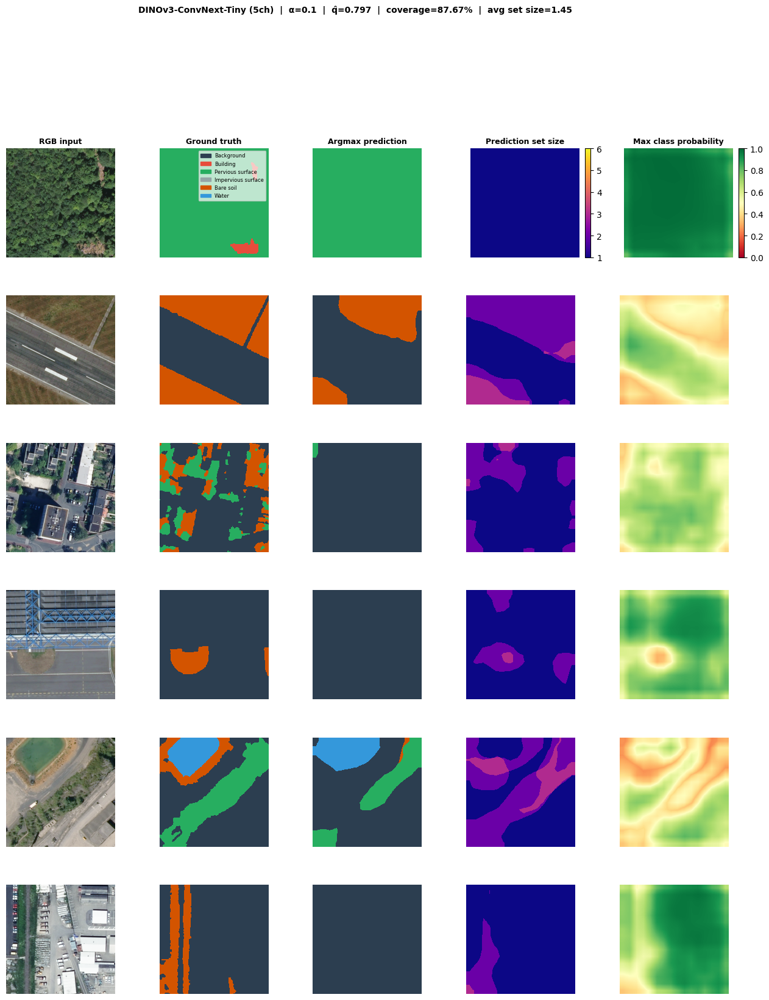

In [ ]:
samples_imgs     = [img  for batch in all_images    for img  in batch]
samples_masks    = [mask for batch in all_masks     for mask in batch]
samples_probs    = [prob for batch in all_probs     for prob in batch]
samples_setsize  = [ss   for batch in set_size_maps for ss   in batch]
samples_predsets = [ps   for batch in pred_set_maps for ps   in batch] # Not directly used by plot_qualitative_grid, but good to keep if needed later

plot_qualitative_grid(samples_imgs, samples_masks, samples_probs, samples_setsize,
                        RGB_CHANNELS, CLASS_NAMES, PALETTE, NUM_CLASSES, VIZ_SAMPLES,
                        model_entry['label'], ALPHA, q_hat, coverage, avg_set_size,
                        VIZ_OUT_DIR, MODEL_KEY, cp_config['visualization']['dpi'])

## Multi-model comparison

In [ ]:
results = []
for entry in cp_config["models"]:
    print(f"\n── {entry['label']} ──")
    try:
        r = run_conformal_for_model(entry, train_config, ALPHA, device, REPO_ROOT, NUM_CLASSES)
        results.append(r)
        print(f"  q̂={r['q_hat']:.3f}  coverage={r['coverage']:.2%}  avg_set={r['avg_set_size']:.2f}")
    except Exception as e:
        print(f"  Skipped ({e})")


── ResNet34-UNet (5ch) ──


Evaluating: 100%|██████████| 4/4 [00:01<00:00,  2.49it/s]


  q̂=0.795  coverage=85.24%  avg_set=1.44

── ResNet34-UNet (3ch) ──


Evaluating: 100%|██████████| 4/4 [00:01<00:00,  2.78it/s]


  q̂=0.788  coverage=84.01%  avg_set=1.45

── ConvNext-Tiny (3ch) ──


Evaluating: 100%|██████████| 4/4 [00:01<00:00,  2.39it/s]


  q̂=0.762  coverage=80.84%  avg_set=1.38

── ConvNext-Tiny (5ch) ──


Evaluating: 100%|██████████| 4/4 [00:01<00:00,  2.35it/s]


  q̂=0.784  coverage=84.99%  avg_set=1.52

── DINOv3-ConvNext-Tiny (5ch) ──


Loading weights:   0%|          | 0/180 [00:00<?, ?it/s]

Evaluating: 100%|██████████| 4/4 [00:01<00:00,  2.46it/s]


  q̂=0.797  coverage=87.67%  avg_set=1.45

── DINOv3-ConvNext-Tiny (3ch) ──


Loading weights:   0%|          | 0/180 [00:00<?, ?it/s]

Evaluating: 100%|██████████| 4/4 [00:01<00:00,  2.30it/s]

  q̂=0.756  coverage=84.27%  avg_set=1.42


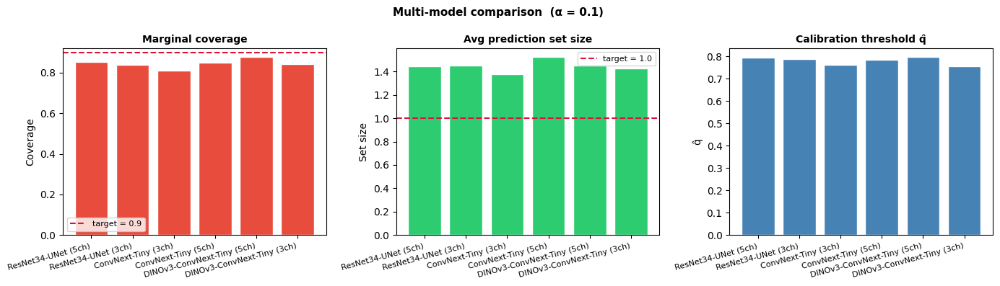

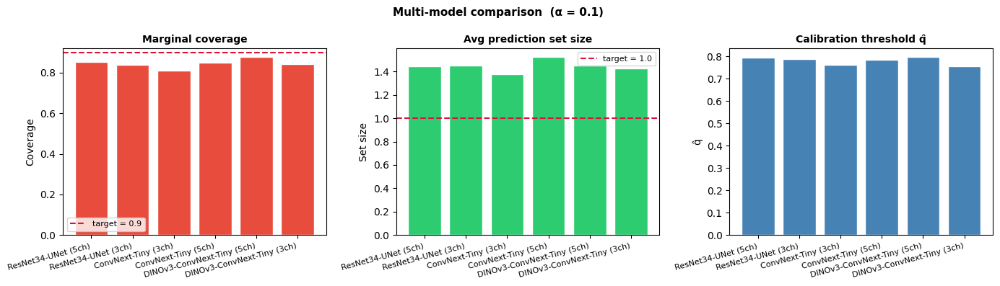

In [ ]:
plot_multi_model_comparison(results, ALPHA, VIZ_OUT_DIR, cp_config['visualization']['dpi'])